# Team BigPicture 빅데이터 언어 팀 프로젝트
#### 데이터 링크 : https://www.kaggle.com/yamqwe/tiktok-trending-tracks
#### 데이터 이름 : TikTok 트렌드 음반 데이터
#### 데이터 설명 : The dataset contains trending tracks featured on TikTok. This dataset was created by Team Dan and contains around 7000 tracks along with liveness score, technical information and other features such as: Duration, Playlist name, and more.


## 01. 데이터 EDA_matplot, scipy.stats, seaborn, numpy

In [15]:
#pip install mathplot

In [16]:
import csv
import pandas as pd
from operator import itemgetter
from networkx.algorithms import community

import numpy as np
import network as nx
import seaborn as sns
import scipy.stats as stats

import matplotlib.pyplot as plt
plt.rc('font', family ='NanumBarunGothicOTF') # 한글폰트 사용을 위한 설정

In [17]:
# 데이터 임포트
data_original = pd.read_csv("tiktok.csv")
df = data_original.copy() # hard copy
df

,track_id,track_name,artist_id,artist_name,album_id,duration,release_date,popularity,danceability,energy,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,playlist_id,playlist_name,duration_mins,genre
0,6kVuF2PYLuvl9T85XjNbaO,Lay It Down Gmix - Main,1Xfmvd48oOhEWkscWyEbh9,Lloyd,43C6GVlhXG4KfZuEbxty3r,302186,2011-01-01,28,0.597,0.800,...,0.3120,0.0461,0.000000,0.1800,0.565,155.932,6kVuF2PYLuvl9T85XjNbaO,6kVuF2PYLuvl9T85XjNbaO,5.036433,TIKTOK DANCE
1,1RGIjMFMgJxkZHMDXVYzOJ,Bartender (feat. Akon),3aQeKQSyrW4qWr35idm0cy,T-Pain,6CrSEKCF4TYrbSIitegb3h,238800,2007-06-05,75,0.832,0.391,...,0.0628,0.0564,0.000000,0.2240,0.436,104.961,1RGIjMFMgJxkZHMDXVYzOJ,1RGIjMFMgJxkZHMDXVYzOJ,3.980000,TIKTOK DANCE
2,1RGIjMFMgJxkZHMDXVYzOJ,Bartender (feat. Akon),3aQeKQSyrW4qWr35idm0cy,T-Pain,6CrSEKCF4TYrbSIitegb3h,238800,2007-06-05,75,0.832,0.391,...,0.0628,0.0564,0.000000,0.2240,0.436,104.961,1RGIjMFMgJxkZHMDXVYzOJ,1RGIjMFMgJxkZHMDXVYzOJ,3.980000,TIKTOK DANCE
3,1dIWPXMX4kRHj6Dt2DStUQ,Chosen (feat. Ty Dolla $ign),4qXC0i02bSFstECuXP2ZpL,Blxst,7AwrgenNcTAJlJF3pKL0Qr,161684,2020-12-04,76,0.571,0.767,...,0.2870,0.3360,0.000000,0.0809,0.605,93.421,1dIWPXMX4kRHj6Dt2DStUQ,1dIWPXMX4kRHj6Dt2DStUQ,2.694733,TIKTOK DANCE
4,4QVS8YCpK71R4FsxSMCjhP,Tie Me Down (with Elley Duhé),2ZRQcIgzPCVaT9XKhXZIzh,Gryffin,69t8rpgBN1ov5kCU6LDMuR,218295,2018-08-03,72,0.548,0.839,...,0.0644,0.1350,0.000000,0.1020,0.314,98.932,4QVS8YCpK71R4FsxSMCjhP,4QVS8YCpK71R4FsxSMCjhP,3.638250,TIKTOK DANCE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6741,1lNHWPDvKEbamKezpLq7HW,no song without you,0Vw76uk7P8yVtTClWyOhac,HONNE,3DG5MS8iKYcJROCnb1DYDf,160346,2020-07-03,64,0.788,0.473,...,0.0328,0.4890,0.254000,0.1090,0.810,105.429,1uOzLrMZoqPIIctv9m48L0,TikTok Trending Philippines: It Really Hurts G...,2.672433,_TIKTOK
6742,7gd01LMH2gBcoDngSt8sq9,Next To You (feat. Justin Bieber),7bXgB6jMjp9ATFy66eO08Z,Chris Brown,6df0qvkMXoyHGt9J8cujZb,265813,2011-03-22,70,0.670,0.676,...,0.0370,0.0201,0.000000,0.1100,0.349,114.974,1uOzLrMZoqPIIctv9m48L0,TikTok Trending Philippines: It Really Hurts G...,4.430217,_TIKTOK
6743,5PYQUBXc7NYeI1obMKSJK0,Never Really Over,6jJ0s89eD6GaHleKKya26X,Katy Perry,3KjXg0MDej2pG9fv6I22lT,223523,2019-05-31,77,0.770,0.882,...,0.0602,0.1940,0.000000,0.3160,0.385,99.991,1uOzLrMZoqPIIctv9m48L0,TikTok Trending Philippines: It Really Hurts G...,3.725383,_TIKTOK
6744,37f4ITSlgPX81ad2EvmVQr,Fight Song,3QLIkT4rD2FMusaqmkepbq,Rachel Platten,0mFDIOqypzHp6Xd0el1hoT,204013,2016-01-01,79,0.564,0.714,...,0.1290,0.0549,0.000000,0.1550,0.330,175.924,1uOzLrMZoqPIIctv9m48L0,TikTok Trending Philippines: It Really Hurts G...,3.400217,_TIKTOK


In [18]:
# 컬럼명 출력
cols = df.columns
cols

Index(['track_id', 'track_name', 'artist_id', 'artist_name', 'album_id',
       'duration', 'release_date', 'popularity', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'playlist_id',
       'playlist_name', 'duration_mins', 'genre'],
      dtype='object')

In [19]:
# 개요
df.describe()

,duration,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_mins
count,6746.000000,6746.000000,6746.000000,6746.000000,6746.000000,6746.000000,6746.000000,6746.000000,6746.000000,6746.000000,6746.000000,6746.000000,6746.000000,6746.000000
mean,194428.739253,57.649422,0.740926,0.624474,5.292914,-7.005657,0.581382,0.140059,0.219776,0.033784,0.177595,0.547327,120.525980,3.240479
std,59208.593470,24.616537,0.137951,0.174433,3.746116,2.846230,0.493369,0.128355,0.236456,0.138327,0.135816,0.230005,25.597213,0.986810
min,43426.000000,0.000000,0.150000,0.023700,0.000000,-26.888000,0.000000,0.023200,0.000010,0.000000,0.019300,0.033100,54.367000,0.723767
25%,155866.000000,44.000000,0.663000,0.504000,1.000000,-8.534000,0.000000,0.048600,0.031700,0.000000,0.092700,0.372000,100.053000,2.597767
50%,186980.000000,64.000000,0.757000,0.621000,6.000000,-6.609000,1.000000,0.084200,0.130000,0.000000,0.122000,0.543000,120.986000,3.116333
75%,224284.000000,76.000000,0.843000,0.752000,9.000000,-5.018000,1.000000,0.203000,0.321000,0.000215,0.224000,0.735000,135.001750,3.738067
max,716206.000000,100.000000,0.990000,0.999000,11.000000,1.077000,1.000000,0.911000,0.991000,0.962000,0.952000,0.998000,216.053000,11.936767


In [20]:
print("각 변수들의 Unique값 갯수")
for i in range(len(cols)):
    print(cols[i]+" : ", end = "")
    print(len(df[cols[i]].unique()))
    

각 변수들의 Unique값 갯수
track_id : 3560
track_name : 3209
artist_id : 2087
artist_name : 2086
album_id : 3278
duration : 3222
release_date : 1257
popularity : 101
danceability : 621
energy : 769
key : 12
loudness : 2908
mode : 2
speechiness : 1062
acousticness : 1630
instrumentalness : 1422
liveness : 946
valence : 931
tempo : 3116
playlist_id : 2558
playlist_name : 2558
duration_mins : 3222
genre : 4


In [21]:
# 결측치 확인
df.isnull().any()

track_id            False
track_name          False
artist_id           False
artist_name         False
album_id            False
duration            False
release_date        False
popularity          False
danceability        False
energy              False
key                 False
loudness            False
mode                False
speechiness         False
acousticness        False
instrumentalness    False
liveness            False
valence             False
tempo               False
playlist_id         False
playlist_name       False
duration_mins       False
genre               False
dtype: bool

array([[<AxesSubplot:title={'center':'duration'}>,
        <AxesSubplot:title={'center':'popularity'}>,
        <AxesSubplot:title={'center':'danceability'}>,
        <AxesSubplot:title={'center':'energy'}>],
       [<AxesSubplot:title={'center':'key'}>,
        <AxesSubplot:title={'center':'loudness'}>,
        <AxesSubplot:title={'center':'mode'}>,
        <AxesSubplot:title={'center':'speechiness'}>],
       [<AxesSubplot:title={'center':'acousticness'}>,
        <AxesSubplot:title={'center':'instrumentalness'}>,
        <AxesSubplot:title={'center':'liveness'}>,
        <AxesSubplot:title={'center':'valence'}>],
       [<AxesSubplot:title={'center':'tempo'}>,
        <AxesSubplot:title={'center':'duration_mins'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

findfont: Font family ['NanumBarunGothicOTF'] not found. Falling back to DejaVu Sans.
findfont: Font family ['NanumBarunGothicOTF'] not found. Falling back to DejaVu Sans.


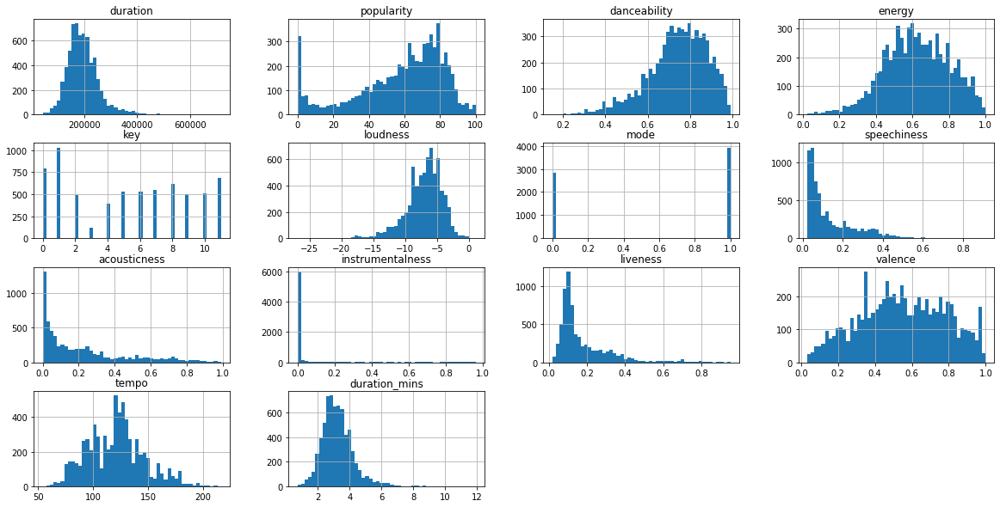

In [22]:
# 수치 변수 히스토그램
df.hist(bins=50, figsize=(20, 10))

<AxesSubplot:>

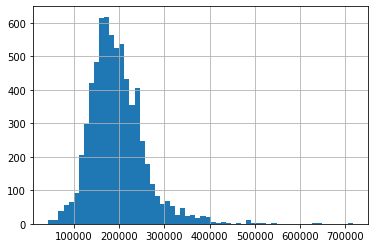

In [23]:
# 영상길이 정보만 자세하게 히스토그램 생성
df['duration'].head(3)
df['duration'].hist(bins = 60)

C:\Users\MSI\anaconda3\lib\site-packages\seaborn\axisgrid.py:132: UserWarning: The handle <matplotlib.patches.Patch object at 0x0000023AC9973F40> has a label of '_TIKTOK' which cannot be automatically added to the legend.
  figlegend = self.fig.legend(handles, labels, **kwargs)


(0.0, 105.0)

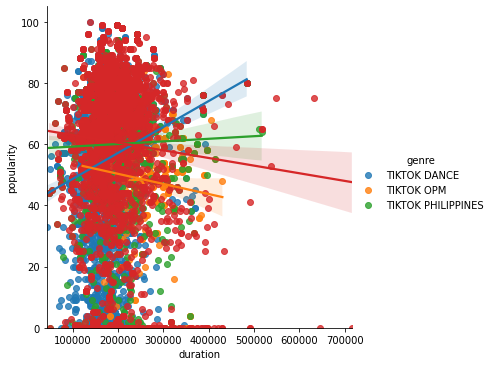

In [24]:
# 영상 길이와 인기 사이의 관계
sns.lmplot(x='duration',y='popularity',data=df,hue='genre')
plt.ylim(0,None)

(0.0, 105.0)

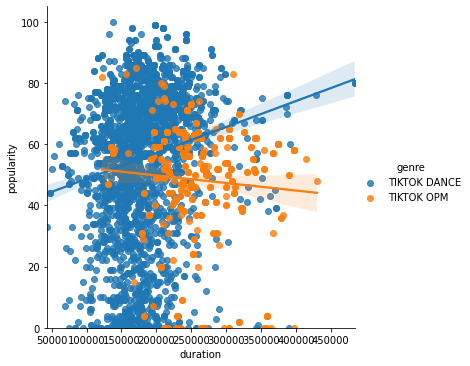

In [25]:
# 더 잘보이도록 표본을 줄임
sns.lmplot(x='duration',y='popularity',data=df.head(3000),hue='genre')
plt.ylim(0,None)

In [26]:
# 수치데이터만 포함하는 DataFrame 생성
value_datas = df[['duration','popularity', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_mins']]

<AxesSubplot:>

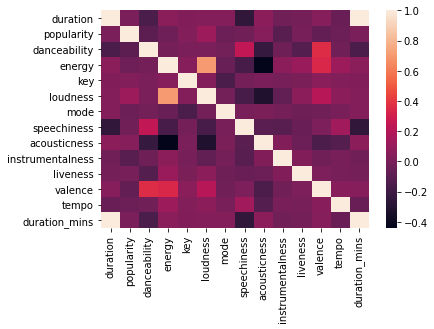

In [27]:
# 히트맵 출력
corr = value_datas.corr()
sns.heatmap(corr)

(-28.286250000000003, 2.47525)

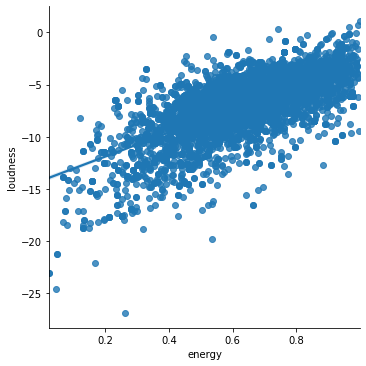

In [28]:
# 상대적으로 높은 선형상관성을 보이는 지표 선형 회귀1
sns.lmplot(x='energy',y='loudness',data=df)
plt.ylim()

(0.10799999999999998, 1.032)

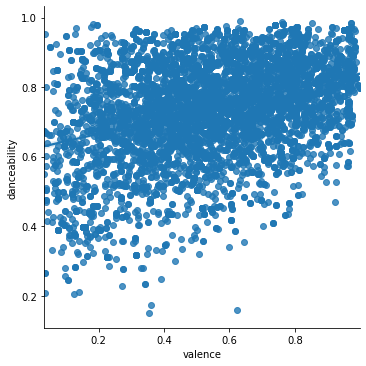

In [29]:
# 상대적으로 높은 선형상관성을 보이는 지표 선형 회귀2
sns.lmplot(x='valence',y='danceability',data=df)
plt.ylim()

C:\Users\MSI\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='duration', ylabel='popularity'>

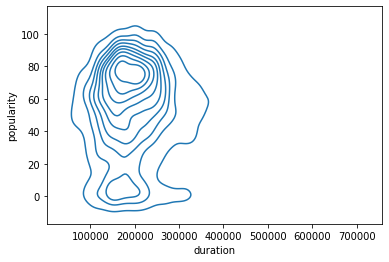

In [30]:
# 인기도와 영상 길이에 대한 밀토플롯
sns.kdeplot(df.duration, df.popularity)

C:\Users\MSI\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='speechiness', ylabel='danceability'>

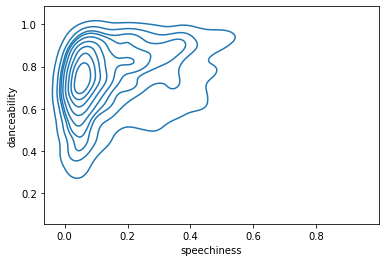

In [31]:
# 주요 소재인 춤과 노래의 출현 빈도
sns.kdeplot(df.speechiness, df.danceability)

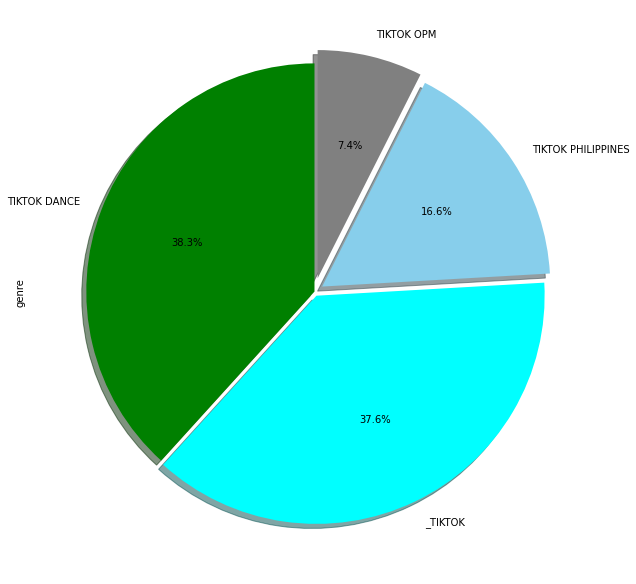

In [32]:
# genre 변수 비율
types = df['genre']
explode = np.arange(len(types.unique())) * 0.02

colors = ['green','cyan','skyblue','gray']
types.value_counts().plot.pie(explode = explode,colors =colors,autopct = '%1.1f%%',shadow = True, startangle =90, figsize =(9,9))
plt.tight_layout()
plt.show()

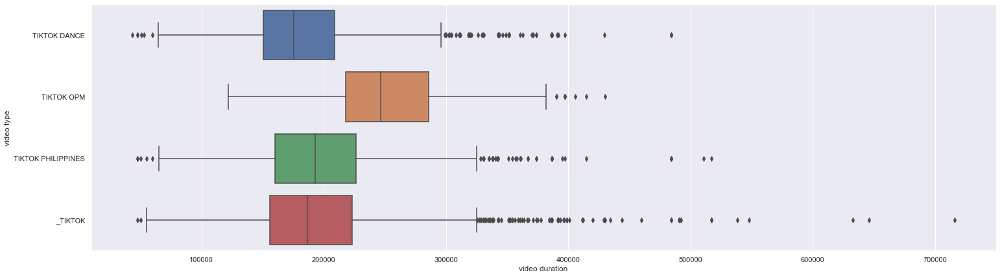

In [33]:
# genre별 영상 길이
sns.set()
plt.figure(figsize =(25,7))
ax = sns.boxplot(x='duration', y='genre',data =df)
ax.set(ylabel ='video type',xlabel = 'video duration')
plt.show()

## 02. 데이터 EDA_ProfileReport

In [34]:
#pip install -U pandas-profiling

In [2]:
import pandas as pd
import pandas_profiling
from pandas_profiling import ProfileReport

data = pd.read_csv('tiktok.csv',encoding='latin1')

pr=data.profile_report() # 프로파일링 결과 리포트를 pr에 저장

#프로파일링 결과 metadata
pr = ProfileReport(data, title="TikTok Trending Tracks Analysis",
        dataset={
        "description": "This profiling report was generated for Analytics TikTok Trending Tracks",
        "copyright_holder": "Team_BigPicture",
        "copyright_year": "2021",
        "url": "https://www.kaggle.com/yamqwe/tiktok-trending-tracks",
    },)


In [3]:
pr

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [37]:
pr.to_file('./Team_BigPicture.html') # pr_report.html 파일로 저장

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## 03. TensorFlow 모델_keras

In [38]:
import pathlib

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [39]:
# 데이터 로드 밑 결측치 확인
df = pd.read_csv("tiktok.csv") # 틱톡 데이터파일 경로 (상대경로)

# dataset = 데이터 분석에 사용하는 전체 데이터셋
dataset = df.copy()[['popularity', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_mins']]
dataset
dataset.isna().sum()

popularity          0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_mins       0
dtype: int64

In [40]:
# 데이터 가공

# train, test 데이터 분리 (모델 학습과 성능 확인을 위해 전체 데이터셋을 두개로 분리)
train_dataset = dataset.sample(frac=0.8,random_state=0)
test_dataset = dataset.drop(train_dataset.index)

# train_stats = 정규화를 위해 필요한 배열
train_stats = train_dataset.describe()
train_stats.pop('valence')
train_stats = train_stats.transpose()

# 예측할 데이터 추출
train_labels = train_dataset.pop('valence')
test_labels = test_dataset.pop('valence')

def norm(x):
    return (x - train_stats['mean']) / train_stats['std']
normed_train_data = norm(train_dataset)
normed_test_data = norm(test_dataset)

In [4]:
def build_model():
    model = keras.Sequential([
        layers.Dense(64, activation='relu', input_shape=[len(train_dataset.keys())]),
        layers.Dense(64, activation='relu'),
        layers.Dense(64, activation='relu'),
        layers.Dense(64, activation='relu'),
        layers.Dense(1)
  ])

    optimizer = tf.keras.optimizers.RMSprop(0.001)

    model.compile(loss='mse',optimizer=optimizer,metrics=['mae', 'mse'])
    return model

model = build_model()
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 64)                832       
_________________________________________________________________
dense_1 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_2 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_3 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 65        
Total params: 13,377
Trainable params: 13,377
Non-trainable params: 0
_________________________________________________________________


In [5]:
class PrintDot(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        if epoch % 100 == 0: print('')
        print('=', end='')

EPOCHS = 100

history = model.fit(normed_train_data, train_labels,epochs=EPOCHS, 
                    validation_split = 0.2, verbose=0,callbacks=[PrintDot()])

In [6]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
95,0.002245,0.036613,0.002245,0.025255,0.099048,0.025255,95
96,0.002282,0.036101,0.002282,0.025304,0.100622,0.025304,96
97,0.002244,0.036093,0.002244,0.025475,0.102362,0.025475,97
98,0.002181,0.035781,0.002181,0.025229,0.097789,0.025229,98
99,0.002131,0.035430,0.002131,0.025682,0.101027,0.025682,99


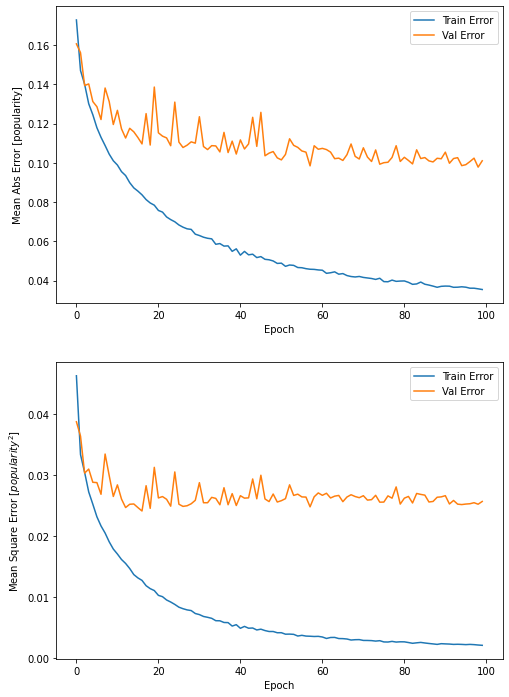

In [7]:
# 모델의 Train 과정을 확인
import matplotlib.pyplot as plt

def plot_history(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    plt.figure(figsize=(8,12))

    plt.subplot(2,1,1)
    plt.xlabel('Epoch')
    plt.ylabel('Mean Abs Error [popularity]')
    plt.plot(hist['epoch'], hist['mae'],label='Train Error')
    plt.plot(hist['epoch'], hist['val_mae'],label = 'Val Error')
    plt.ylim()
    plt.legend()

    plt.subplot(2,1,2)
    plt.xlabel('Epoch')
    plt.ylabel('Mean Square Error [$popularity^2$]')
    plt.plot(hist['epoch'], hist['mse'],label='Train Error')
    plt.plot(hist['epoch'], hist['val_mse'],label = 'Val Error')
    plt.ylim()
    plt.legend()
    plt.show()

plot_history(history)

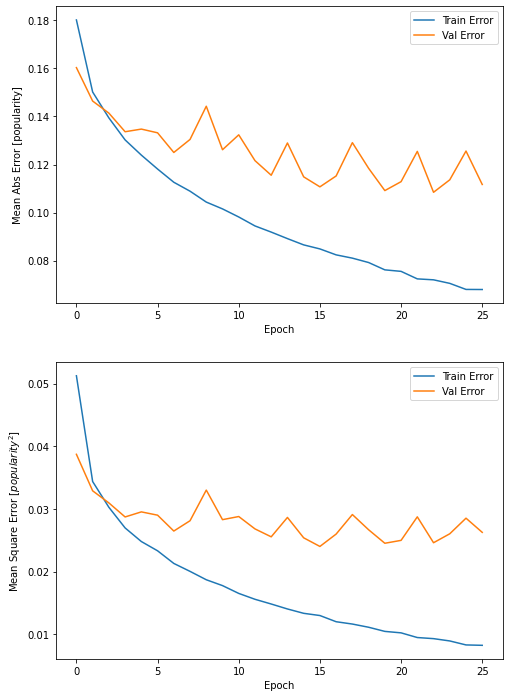

In [8]:
model = build_model()
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)
history = model.fit(normed_train_data, train_labels, epochs=EPOCHS,
                    validation_split = 0.2, verbose=0, callbacks=[early_stop, PrintDot()])
plot_history(history)

In [9]:
loss, mae, mse = model.evaluate(normed_test_data, test_labels, verbose=2)

43/43 - 0s - loss: 0.0261 - mae: 0.1114 - mse: 0.0261


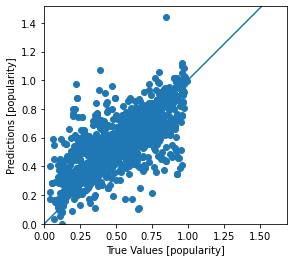

In [10]:
test_predictions = model.predict(normed_test_data).flatten()

plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [popularity]')
plt.ylabel('Predictions [popularity]')
plt.axis('equal')
plt.axis('square')
plt.xlim([0,plt.xlim()[1]])
plt.ylim([0,plt.ylim()[1]])
_ = plt.plot([-100, 100], [-100, 100])

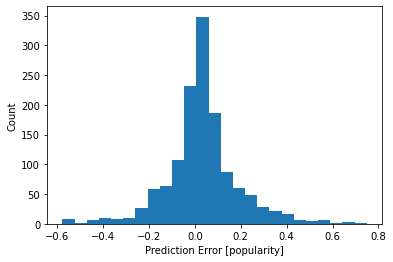

In [11]:
error = test_predictions - test_labels
plt.hist(error, bins = 25)
plt.xlabel("Prediction Error [popularity]")
_ = plt.ylabel("Count")

In [13]:
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_squared_log_error
pred = model.predict(normed_test_data).flatten()
origin = test_labels

MAE =  mean_absolute_error(origin, pred)
# MAE = 0.45454545454545453

MSE = mean_squared_error(origin, pred)
# MSE = 0.45454545454545453

RMSE = np.sqrt(MSE)
# RMSE = 0.674199862463242


R2 = r2_score(origin, pred)
print("MAE :",MAE)
print("MSE :",MSE)
print("RMSE :",RMSE)
print("R2 :",R2)

MAE : 0.11144552000165428
MSE : 0.026065924381079564
RMSE : 0.16144944837651062
R2 : 0.5089947926710543


In [14]:
# 영상의 속성을 x값으로 받아 인기도를 예측해주는 모델 _ GUI에 넣을만한 기능 2
# normed_train_data = norm(train_dataset)
test_predictions = model.predict(normed_test_data.head()).flatten()
print("popularity prediction :",test_predictions[0])

popularity prediction : 0.6843832
